In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import datetime as dt
import nltk

from nltk.sentiment.vader import SentimentIntensityAnalyzer
from GoogleNews import GoogleNews
from newspaper import Article
from newspaper import Config
from wordcloud import WordCloud, STOPWORDS
#nltk.download('vader_lexicon') #required for Sentiment Analysis


In [67]:
#pip install GoogleNews


In [128]:
#pip install gensim==4.1.2

  Attempting uninstall: Cython
    Found existing installation: Cython 0.29.28
    Uninstalling Cython-0.29.28:
      Successfully uninstalled Cython-0.29.28
  Attempting uninstall: gensim
    Found existing installation: gensim 4.2.0
    Uninstalling gensim-4.2.0:
      Successfully uninstalled gensim-4.2.0
Note: you may need to restart the kernel to use updated packages.


# Collecting articles from Googlenews

In [ ]:
#################################################################################################################

In [3]:
#nltk.download('punkt')

user_agent = 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_5) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.102 Safari/537.36'
#user_agent = 'Mozilla/5.0 (X11; Ubuntu; Linux i686; rv:24.0) Gecko/20100101 Firefox/24.0'
#user_agent = "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/13.1.1 Safari/605.1.15"

config = Config()
config.browser_user_agent = user_agent
googlenews=GoogleNews()
googlenews.search('allintext:supply chain risk')# OR risk management OR transportation risk', period='7d')
result=googlenews.result()
df=pd.DataFrame(result)
print(df.head())
for i in range(2,20):
    googlenews.getpage(i)
    result=googlenews.result()
    df=pd.DataFrame(result)
list=[]
for ind in df.index:
    dict={}
    article = Article(df['link'][ind],config=config)
    try:
        article.download()
        article.parse()
        article.nlp()
        dict['Date']=df['date'][ind]
        dict['Media']=df['media'][ind]
        dict['Title']=article.title
        dict['Article']=article.text
        dict['Summary']=article.summary
        list.append(dict)
    except:
        pass 
print(list)
news_df=pd.DataFrame(list)

news_df.to_csv(r"C:\Users\apoko\Desktop\BAM\Thesis\Code\thesis-main\articlesnew.csv")
#here I have to change name everytime it gets downloaded, also check for a certain directory



Empty DataFrame
Columns: []
Index: []
[]


In [25]:
user_agent = 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_5) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.102 Safari/537.36'
config = Config()
config.browser_user_agent = user_agent
googlenews=GoogleNews(start='05/01/2022',end='05/31/2022')
googlenews.search('Supply Chain Risk')
result=googlenews.result()
df=pd.DataFrame(result)
print(df.head())
for i in range(2,20):
    googlenews.getpage(i)
    result=googlenews.result()
    df=pd.DataFrame(result)
list=[]
for ind in df.index:
    dict={}
    article = Article(df['link'][ind],config=config)
    article.download()
    article.parse()
    article.nlp()
    dict['Date']=df['date'][ind]
    dict['Media']=df['media'][ind]
    dict['Title']=article.title
    dict['Article']=article.text
    dict['Summary']=article.summary
    list.append(dict)
news_df=pd.DataFrame(list)
news_df.to_excel("articles.xlsx")

Empty DataFrame
Columns: []
Index: []


In [30]:
from gnews import GNews

google_news = GNews()
result = google_news.get_news('Supply Chain Risk')
df=pd.DataFrame(result)
print(df.head())


                                               title  \
0  Supply Chain Risk: An Operational Resilience P...   
1  Developing a strong supply chain risk manageme...   
2  Why supply chain risk management is a top prio...   
3  Supply Chain's New Risk Profile - Workers Comp...   
4  CISA is Developing Guidelines For Managing Cyb...   

                                         description  \
0  Supply Chain Risk: An Operational Resilience P...   
1  Developing a strong supply chain risk manageme...   
2  Why supply chain risk management is a top prio...   
3  Supply Chain's New Risk Profile  Workers Comp ...   
4  CISA is Developing Guidelines For Managing Cyb...   

                  published date  \
0  Thu, 02 Jun 2022 07:00:00 GMT   
1  Tue, 21 Jun 2022 19:05:00 GMT   
2  Tue, 14 Jun 2022 07:00:00 GMT   
3  Wed, 01 Jun 2022 07:00:00 GMT   
4  Tue, 21 Jun 2022 20:50:41 GMT   

                                                 url  \
0  https://www.newsweek.com/supply-chain-risk-ope... 

In [33]:


list=[]
for ind in df.index:
    dict={}
    article = google_news.get_full_article(result[ind]['url'])
    #article = Article(df['url'][ind],config=config)
    try:
        #print(article.text[ind])
        article.download()
        article.parse()
        article.nlp()
        dict['Date']=df['published date'][ind]
        #dict['Media']=df['media'][ind]
        dict['Title']=article.title
        dict['Article']=article.text
        #dict['description']=article.description  
        list.append(dict)
    except:
        pass
news_df=pd.DataFrame(list)
news_df.to_excel("articles.xlsx")

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


ERROR: Article `download()` failed with 403 Client Error: Forbidden for url: https://www.newsweek.com/supply-chain-risk-operational-resilience-perspective-1712162 on URL https://www.newsweek.com/supply-chain-risk-operational-resilience-perspective-1712162
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


ERROR: Article `download()` failed with HTTPSConnectionPool(host='www.technewsworld.com', port=443): Read timed out. (read timeout=7) on URL https://www.technewsworld.com/story/ransomware-greatest-risk-to-supply-chain-in-minds-of-it-pros-176830.html
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


ERROR: Article `download()` failed with 403 Client Error: Max restarts limit reached for url: https://www.forbes.com/sites/paulnoble/2022/06/23/when-it-comes-to-cpg-and-food--beverage-companiesinvesting-in-purpose-built-supply-chain-intelligence-matters/ on URL https://www.forbes.com/sites/paulnoble/2022/06/23/when-it-comes-to-cpg-and-food--beverage-companiesinvesting-in-purpose-built-supply-chain-intelligence-matters/
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


ERROR: Article `download()` failed with 403 Client Error: Forbidden for url: https://www.logisticsmgmt.com/article/risk_management_investment_in_tech_takes_off on URL https://www.logisticsmgmt.com/article/risk_management_investment_in_tech_takes_off


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


ERROR: Article `download()` failed with 403 Client Error: Forbidden for url: https://healthitsecurity.com/news/healthcare-orgs-struggle-with-software-supply-chain-risk-management-policies on URL https://healthitsecurity.com/news/healthcare-orgs-struggle-with-software-supply-chain-risk-management-policies


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


In [ ]:
#############################################################################################################

In [4]:
news_df=pd.read_excel("articles1.xlsx")

In [5]:
news_df["Date"]= news_df["Date"].str[5:16]

In [6]:
news_df.Date.sort_values()

39    01 Jun 2022
2     01 Jun 2022
32    01 Jun 2022
42    01 Jun 2022
24    01 Jun 2022
         ...     
82    28 Apr 2022
63    30 May 2022
21    30 May 2022
91    31 Mar 2022
5     31 May 2022
Name: Date, Length: 95, dtype: object

In [7]:
from datetime import datetime


def string_to_date(d):
    return datetime.strptime(d, '%d %b %Y').strftime('%Y-%m-%d')

In [8]:
for ind in news_df.index:
    news_df["date"]=ind
for ind in news_df.index:
    news_df["date"][ind]=(string_to_date(news_df.Date[ind]))

<ipython-input-8-e26fa4af3d11>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  news_df["date"][ind]=(string_to_date(news_df.Date[ind]))


In [9]:
news_df.date.sort_values()

90    2021-11-01
66    2021-11-04
86    2021-11-16
72    2021-11-23
77    2021-12-06
         ...    
70    2022-06-23
76    2022-06-23
43    2022-06-23
57    2022-06-23
23    2022-06-23
Name: date, Length: 95, dtype: object

In [10]:
news_df.sort_values(by=['date'],ignore_index=True, inplace=True)

In [11]:
news_df

,Unnamed: 0,Date,Title,Article,date
0,90,01 Nov 2021,Supply chain risk management is now a GovCon n...,Against a backdrop of highly publicized cyber ...,2021-11-01
1,66,04 Nov 2021,Managing supply chain risk requires new priori...,Words like supply chain and logistics first be...,2021-11-04
2,86,16 Nov 2021,Supply Chain & Procurement Live: Risk and resi...,"In this Supply Chain Live session, three suppl...",2021-11-16
3,72,23 Nov 2021,How COVID-19 is reshaping supply chains,"In May 2020, much of the world was still in th...",2021-11-23
4,77,06 Dec 2021,Supply Chain Risk Isn’t Going Away Anytime Soon,As the holidays approached and supply chains r...,2021-12-06
...,...,...,...,...,...
90,70,23 Jun 2022,Increase in leptin levels in preeclampsia prom...,"Before a baby is ever born, critical supply ch...",2022-06-23
91,76,23 Jun 2022,Military rad-hard design activity robust despi...,Military rad-hard design activity robust despi...,2022-06-23
92,43,23 Jun 2022,"Rising at CAGR of 14.5% from 2022 to 2030, Ven...",Acumen Research and Consulting\n\nAcumen Resea...,2022-06-23
93,57,23 Jun 2022,IonQ and GE Research Demonstrate High Potentia...,"COLLEGE PARK, Md.--(BUSINESS WIRE)--IonQ (NYSE...",2022-06-23


In [12]:
###31/07 dtm & descriptive


In [510]:
from tmtoolkit.corpus import Corpus, print_summary
from tmtoolkit.corpus import (lemmatize, filter_for_pos, to_lowercase,
    remove_punctuation, filter_clean_tokens, remove_common_tokens,
    tokens_table)


In [517]:
tup = tuple(news_df['Article'])


In [522]:
Corpus(news_df['Article'])

ValueError: either `language`, `language_model` or `spacy_instance` must be given

In [523]:
corpus_norm = lemmatize(tup, inplace=False)
filter_for_pos(corpus_norm, 'N')
to_lowercase(corpus_norm)
remove_punctuation(corpus_norm)
filter_clean_tokens(corpus_norm, remove_shorter_than=2)
# remove tokens that occur in all documents
remove_common_tokens(corpus_norm, df_threshold=5, proportions=0)

tokens_table(corpus_norm)

ValueError: first argument must be a Corpus object

In [ ]:
##############

In [13]:
import nltk
import re
from tqdm import tqdm
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
lemmatizer = WordNetLemmatizer()

In [14]:
sentences=[]
news_df['Article']= news_df['Article'].astype(str)

for i in news_df['Article'].index:
    sentences.append(nltk.sent_tokenize(news_df.Article[i]))

type(sentences)
import numpy as np
from numpy import ndarray
def flatten(input):
    new_list = []
    for i in input:
        for j in i:
            new_list.append(j)
    return new_list


In [15]:
sentences=flatten(sentences)
sentences

['Against a backdrop of highly publicized cyber hacks, ransomware attacks and extended goods shortages, supply chain risk management has taken center stage as a pressing operational and national security concern.',
 'This increased focus on strengthening and securing critical U.S. supply chains has already resulted in new requirements appearing in federal acquisitions, obligating federal contractors to identify, assess and mitigate supply chain-related security threats.',
 'At this moment – as cyber and SCRM-related regulatory and contractual requirements are being implemented – there is an opportunity for motivated government contractors to stand out and differentiate themselves with strong SCRM practices.',
 'Doing so will better position these organizations to mentor and assist critical suppliers, minimize future cyber and supply chain disruptions, support national resilience and deliver value to agency customers.',
 'To put it simply, a short-term focus that fails to consider suppl

In [52]:
stop_words = set(stopwords.words("english"))


In [53]:
my_stop_words = text.ENGLISH_STOP_WORDS.union(['main','supply','disruption', 'disruptions','risks',
  'png','https doi','https doi org','org','org 10','doi org 10','10','org 10 1016','2018','1016','2016','2015','2017',
'https','dco','volume',
  'march',
  'article',
  'fla',
  'the',
  'research',
  'center',
  'for',
  'docsubtype',
  'doctype',
  'doi',
  'eid',
  'ewtransactionid',
  'hubeid',
  'indexeddate',
  'issn',
  'issnnorm',
  'itemstage',
  'itemtransactionid',
  'itemweight','serial','jl','journal',"chain","supply chain","2020","management","2021","risk","al","et","et al","al 2021","et al 2020","et al 2021","2019"])

In [54]:
stop_words=my_stop_words

In [55]:
corpus=[]
for i in tqdm(range(len(sentences))):
    review = re.sub('[^a-zA-Z]', ' ', sentences[i])
    review = review.lower()
    review = review.split()
    review = [lemmatizer.lemmatize(word) for word in review if not word in set(stop_words)]
    review = ' '.join(review)
    corpus.append(review)

100%|████████████████████████████████████| 3357/3357 [00:00<00:00, 4620.78it/s]


In [47]:
corpus

['backdrop highly publicized cyber hack ransomware attack extended good shortage taken stage pressing operational national security concern',
 'increased focus strengthening securing critical u s chain resulted new requirement appearing federal acquisition obligating federal contractor identify ass mitigate related security threat',
 'moment cyber scrm related regulatory contractual requirement implemented opportunity motivated government contractor stand differentiate strong scrm practice',
 'doing better position organization mentor assist critical supplier minimize future cyber support national resilience deliver value agency customer',
 'simply short term focus fails consider invite possibility new stress national security posture expose company reputational harm financial liability',
 'consideration federal contractor ready seize scrm differentiator',
 'scrm important customer face rising uncertainty data security surveillance foreign adversary federal agency progressively relying

In [56]:
corpus_token=[]
for i in tqdm(range(len(sentences))):
    review=re.sub('[^a-zA-Z]', ' ', sentences[i])
    review = review.split()
    corpus_token.append(review)
corpus_token

100%|███████████████████████████████████| 3357/3357 [00:00<00:00, 95879.43it/s]


[['Against',
  'a',
  'backdrop',
  'of',
  'highly',
  'publicized',
  'cyber',
  'hacks',
  'ransomware',
  'attacks',
  'and',
  'extended',
  'goods',
  'shortages',
  'supply',
  'chain',
  'risk',
  'management',
  'has',
  'taken',
  'center',
  'stage',
  'as',
  'a',
  'pressing',
  'operational',
  'and',
  'national',
  'security',
  'concern'],
 ['This',
  'increased',
  'focus',
  'on',
  'strengthening',
  'and',
  'securing',
  'critical',
  'U',
  'S',
  'supply',
  'chains',
  'has',
  'already',
  'resulted',
  'in',
  'new',
  'requirements',
  'appearing',
  'in',
  'federal',
  'acquisitions',
  'obligating',
  'federal',
  'contractors',
  'to',
  'identify',
  'assess',
  'and',
  'mitigate',
  'supply',
  'chain',
  'related',
  'security',
  'threats'],
 ['At',
  'this',
  'moment',
  'as',
  'cyber',
  'and',
  'SCRM',
  'related',
  'regulatory',
  'and',
  'contractual',
  'requirements',
  'are',
  'being',
  'implemented',
  'there',
  'is',
  'an',
  'opp

# TF-IDF

In [57]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction import text

from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import string
from nltk.corpus import stopwords
import json
import glob
import re

In [58]:


def load_data(file):
    with open (file, "r", encoding="utf-8") as f:
        data = json.load(f)
    return (data)

def write_data(file, data):
    with open (file, "w", encoding="utf-8") as f:
        json.dump(data, f, indent=4)

def remove_stops(text, stops):
    words = text.split()
    final = []
    for word in words:
        if word not in stops:
            final.append(word)
    final = " ".join(final)
    final = final.translate(str.maketrans("", "", string.punctuation))
    final = "".join([i for i in final if not i.isdigit()])
    while "  " in final:
        final = final.replace("  ", " ")
    return (final)

def clean_docs(docs):
    stops = stopwords.words("english")
    months = load_data("data/months.json")
    stops = stops+months
    final = []
    for doc in docs:
        clean_doc = remove_stops(doc, stops)
        final.append(clean_doc)
    return (final)

In [60]:

vectorizer = TfidfVectorizer(
                                lowercase=True,
                                max_features=100,
                                max_df=0.8,
                                min_df=5,
                                ngram_range = (1,3),
                                stop_words = stop_words

                            )

vectors = vectorizer.fit_transform(sentences)

feature_names = vectorizer.get_feature_names()

dense = vectors.todense()
denselist = dense.tolist()

all_keywords = []

for description in denselist:
    x=0
    keywords = []
    for word in description:
        if word > 0:
            keywords.append(feature_names[x])
        x=x+1
    all_keywords.append(keywords)
print (sentences[2000])
print (all_keywords[2000])



Manufacturing & Engineering Magazine | The Home of Manufacturing Industry News
['industry', 'manufacturing']


In [66]:
true_k = 7

model = KMeans(n_clusters=true_k, init="k-means++", max_iter=100, n_init=1)

model.fit(vectors)

order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

with open ("data/trc_results.txt", "w", encoding="utf-8") as f:
    for i in range(true_k):
        f.write(f"Cluster {i}")
        f.write("\n")
        for ind in order_centroids[i, :10]:
            f.write (' %s' % terms[ind],)
            f.write("\n")
        f.write("\n")
        f.write("\n")

Plotting the k-clusters from tf-idf + kmeans

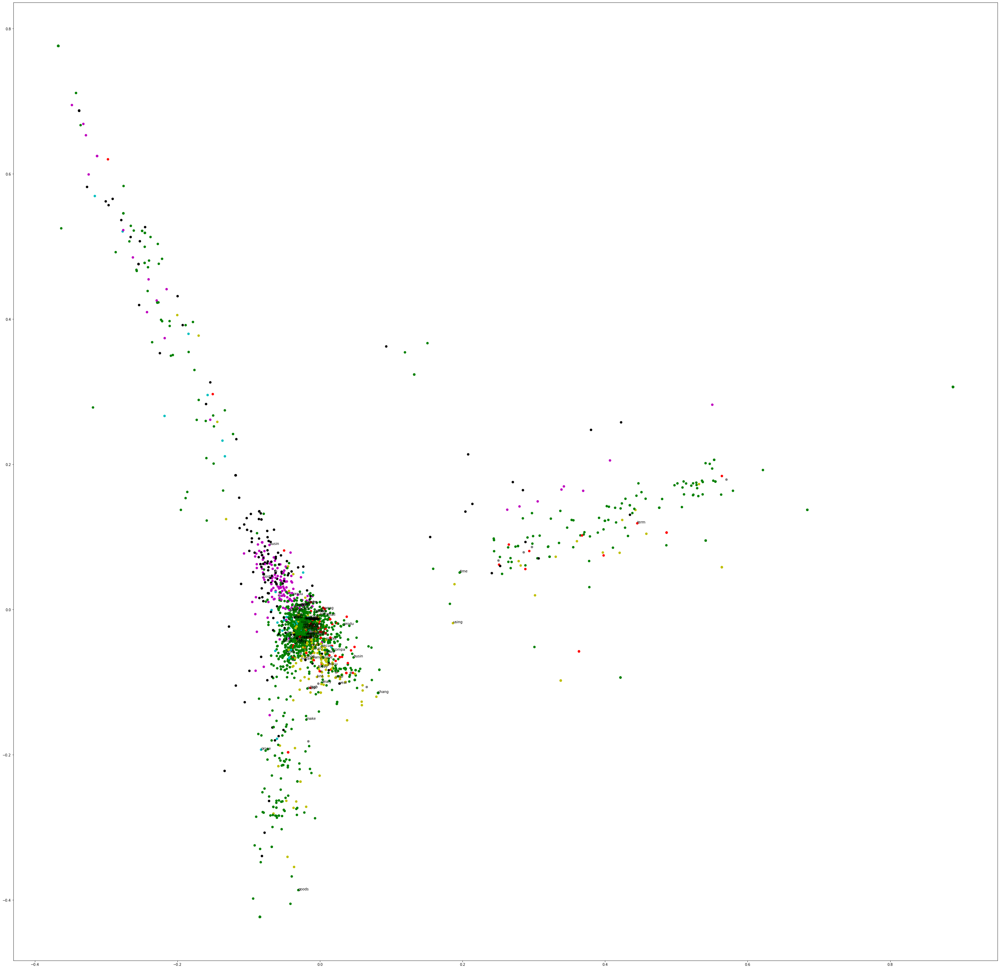

In [67]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

kmean_indices = model.fit_predict(vectors)

pca=PCA(n_components=20)
scatter_plot_points=pca.fit_transform(vectors.toarray())

colors = ["r", "c", "y", "m", "k","g", "0.5"]

x_axis= [o[0] for o in scatter_plot_points]
y_axis= [o[1] for o in scatter_plot_points]

fix, ax= plt.subplots(figsize=(50,50))

ax.scatter(x_axis, y_axis, c=[colors[d] for d in kmean_indices])

#I put terms in enumerate, he puts names. Check if it needs sth else to make more sense
for i, txt in enumerate(terms):
    ax.annotate(txt[0:5], (x_axis[i], y_axis[i]))
    
plt.savefig("trc.png")
    

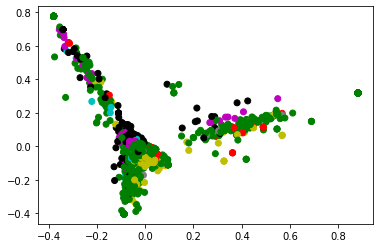

In [68]:
X = pca.fit_transform(vectors.toarray())

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.scatter(data2D[:,0], data2D[:,1], c=[colors[d] for d in kmean_indices])
plt.show()


# LDA Topic Modeling

In [25]:
import numpy as np
import json
import glob

#Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

#spacy
import spacy
from nltk.corpus import stopwords

#vis
import pyLDAvis
import pyLDAvis.gensim_models

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [26]:
def load_data(file):
    with open (file, "r", encoding="utf-8") as f:
        data = json.load(f) 
    return (data)

def write_data(file, data):
    with open (file, "w", encoding="utf-8") as f:
        json.dump(data, f, indent=4)

In [27]:
articles = pd.read_excel("articles1.xlsx")["Article"]
articles=articles.to_list()
res=write_data("data/res.json", articles)
articles=str(articles)
#res = articles.to_json(orient="columns")
#parsed = json.loads(res)
#json.dumps(parsed, indent=4) 
    #print (data[0][0:90])

In [28]:
data = load_data("data/res.json")
print (data)

["The world is a difficult place to be as a supply chain expert today and will only get more difficult in the future. We're living in a time of near unprecedented uncertainty in the modern era and the risk it brings to supply chain management is immense. To manage the potential chaos, you must be proactive and prepared to shift your strategies on a dime. From natural disasters and wars, to trade disputes and unreliable suppliers, you must be ready for everything.\n\nHow to create a strong risk management strategy.\n\nTrain your team in risk awareness and build organizational habits around it\n\nRisk management is built from the ground up. When you're trying to make plans around what could go wrong in your organization, you need to build a framework that allows individual employees to not only spot potential risks, but to report them with no fear or reprisal. Regular training programs on risks for your company and fast-response drills are integral to being ready when something goes wron

In [29]:
#data[0][0:90]
data=data[0:92]

In [30]:
data[0][0:90]


'The world is a difficult place to be as a supply chain expert today and will only get more'

In [31]:
def lemmatization(texts, allowed_postags=["NOUN", "ADJ", "VERB", "ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    texts_out = []
    for text in tqdm(texts):
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        texts_out.append(final)
    return (texts_out)


lemmatized_texts = lemmatization(data)
print (lemmatized_texts[0][0:90])

100%|██████████████████████████████████████████| 92/92 [00:05<00:00, 16.68it/s]

world difficult place supply chain expert today only get more difficult future live time n


In [32]:
print (lemmatized_texts[0][0:90])

world difficult place supply chain expert today only get more difficult future live time n


In [33]:
def gen_words(texts):
    final = []
    for text in texts:
        new = gensim.utils.simple_preprocess(text, deacc=True)
        final.append(new)
    return (final)

data_words = gen_words(lemmatized_texts)

print (data_words[10][0:20])

['more', 'tieup', 'port', 'just', 'about', 'last', 'thing', 'economy', 'need', 'right', 'now', 'current', 'round', 'labor', 'talk', 'management', 'port', 'coast', 'member', 'load']


In [34]:
#BIGRAMS AND TRIGRAMS
bigram_phrases = gensim.models.Phrases(data_words, min_count=5, threshold=100)
trigram_phrases = gensim.models.Phrases(bigram_phrases[data_words], threshold=100)

bigram = gensim.models.phrases.Phraser(bigram_phrases)
trigram = gensim.models.phrases.Phraser(trigram_phrases)

def make_bigrams(texts):
    return([bigram[doc] for doc in texts])

def make_trigrams(texts):
    return ([trigram[bigram[doc]] for doc in texts])

data_bigrams = make_bigrams(data_words)
data_bigrams_trigrams = make_trigrams(data_bigrams)

print (data_bigrams_trigrams[0])

['world', 'difficult', 'place', 'supply', 'chain', 'expert', 'today', 'only', 'get', 'more', 'difficult', 'future', 'live', 'time', 'near', 'unprecedented', 'uncertainty', 'modern', 'era', 'risk', 'bring', 'supply', 'chain', 'management', 'immense', 'manage', 'potential', 'chaos', 'proactive', 'prepare', 'shift', 'strategy', 'dime', 'natural_disaster', 'war', 'trade', 'dispute', 'unreliable', 'supplier', 'ready', 'create', 'strong', 'risk', 'management', 'strategy', 'train', 'team', 'risk', 'awareness', 'build', 'organizational', 'habit', 'risk', 'management', 'build', 'ground', 'up', 'try', 'make', 'plan', 'go', 'wrong', 'organization', 'need', 'build', 'framework', 'allow', 'individual', 'employee', 'only', 'spot', 'potential', 'risk', 'report', 'fear', 'reprisal', 'regular', 'training', 'program', 'risk', 'company', 'fast', 'response', 'drill', 'integral', 'ready', 'go', 'wrong', 'process', 'well', 'know', 'level', 'organization', 'practice', 'regularly', 'important', 'lesson', 'lea

In [35]:
#TF-IDF REMOVAL
from gensim.models import TfidfModel

id2word = corpora.Dictionary(data_bigrams_trigrams)

texts = data_bigrams_trigrams

corpus = [id2word.doc2bow(text) for text in texts]
# print (corpus[0][0:20])

tfidf = TfidfModel(corpus, id2word=id2word)

low_value = 0.03
words  = []
words_missing_in_tfidf = []
for i in range(0, len(corpus)):
    bow = corpus[i]
    low_value_words = [] #reinitialize to be safe. You can skip this.
    tfidf_ids = [id for id, value in tfidf[bow]]
    bow_ids = [id for id, value in bow]
    low_value_words = [id for id, value in tfidf[bow] if value < low_value]
    drops = low_value_words+words_missing_in_tfidf
    for item in drops:
        words.append(id2word[item])
    words_missing_in_tfidf = [id for id in bow_ids if id not in tfidf_ids] # The words with tf-idf socre 0 will be missing

    new_bow = [b for b in bow if b[0] not in low_value_words and b[0] not in words_missing_in_tfidf]
    corpus[i] = new_bow

In [389]:
# id2word = corpora.Dictionary(data_words)

# corpus = []
# for text in data_words:
#     new = id2word.doc2bow(text)
#     corpus.append(new)

# print (corpus[0][0:20])

# word = id2word[[0][:1][0]]
# print (word)

Using all the articles except from the last one (test_doc) which we use it to see on which topic category is more related to

In [38]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=7,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha="auto",
                                           eta=None)
#alpha="auto"

In [37]:
def calculate_coherence_score(n, alpha, beta):
    lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=n, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha=alpha,
                                           per_word_topics=True,
                                           eta = beta,)
    coherence_model_lda = CoherenceModel(model=lda_model, texts=corpus_token, dictionary=id2word, coherence='u_mass')
    coherence_lda = coherence_model_lda.get_coherence()
    return coherence_lda

#list containing various hyperparameters
no_of_topics = [5,7,10,15,20]
alpha_list = ['symmetric',0.01, 0.05, 0.1, 0.2, 0.5, 1]
beta_list = ['auto',0.2,0.14,0.1,0.066,0.02]

scores=[]
N=[]
best_scores=[]
best_N=[]
for n in tqdm(no_of_topics):
    for alpha in alpha_list:
        for beta in beta_list:
            coherence_score = calculate_coherence_score(n, alpha, beta)
            scores.append(coherence_score)
            N.append(n)
            print(f"n : {n} ; alpha : {alpha} ; beta : {beta} ; Score : {coherence_score}")
    best_scores.append(max(scores))
    best_N.append(n)
    

  0%|                                                    | 0/5 [00:00<?, ?it/s]

n : 5 ; alpha : symmetric ; beta : auto ; Score : -10.789867993223053
n : 5 ; alpha : symmetric ; beta : 0.2 ; Score : -10.789867993223053
n : 5 ; alpha : symmetric ; beta : 0.14 ; Score : -10.560084444814237
n : 5 ; alpha : symmetric ; beta : 0.1 ; Score : -10.364479885369423
n : 5 ; alpha : symmetric ; beta : 0.066 ; Score : -10.339866042333943
n : 5 ; alpha : symmetric ; beta : 0.02 ; Score : -10.394195454504516
n : 5 ; alpha : 0.01 ; beta : auto ; Score : -10.608986137433725
n : 5 ; alpha : 0.01 ; beta : 0.2 ; Score : -10.608986137433725
n : 5 ; alpha : 0.01 ; beta : 0.14 ; Score : -10.668994723188003
n : 5 ; alpha : 0.01 ; beta : 0.1 ; Score : -10.34143735954033
n : 5 ; alpha : 0.01 ; beta : 0.066 ; Score : -10.34253740612733
n : 5 ; alpha : 0.01 ; beta : 0.02 ; Score : -10.341565365644705
n : 5 ; alpha : 0.05 ; beta : auto ; Score : -10.495672335136648
n : 5 ; alpha : 0.05 ; beta : 0.2 ; Score : -10.495672335136648
n : 5 ; alpha : 0.05 ; beta : 0.14 ; Score : -10.67050533847778
n

 20%|████████▊                                   | 1/5 [00:47<03:08, 47.07s/it]

n : 5 ; alpha : 1 ; beta : 0.02 ; Score : -10.389194538321357
n : 7 ; alpha : symmetric ; beta : auto ; Score : -10.725384472571909
n : 7 ; alpha : symmetric ; beta : 0.2 ; Score : -10.817776475545474
n : 7 ; alpha : symmetric ; beta : 0.14 ; Score : -10.725384472571909
n : 7 ; alpha : symmetric ; beta : 0.1 ; Score : -10.749621391994054
n : 7 ; alpha : symmetric ; beta : 0.066 ; Score : -10.751916994335762
n : 7 ; alpha : symmetric ; beta : 0.02 ; Score : -11.016764280143027
n : 7 ; alpha : 0.01 ; beta : auto ; Score : -10.947265818619796
n : 7 ; alpha : 0.01 ; beta : 0.2 ; Score : -11.349356575942355
n : 7 ; alpha : 0.01 ; beta : 0.14 ; Score : -10.946496353305937
n : 7 ; alpha : 0.01 ; beta : 0.1 ; Score : -10.958349447674351
n : 7 ; alpha : 0.01 ; beta : 0.066 ; Score : -11.043909642946227
n : 7 ; alpha : 0.01 ; beta : 0.02 ; Score : -11.0304691690754
n : 7 ; alpha : 0.05 ; beta : auto ; Score : -10.970348502098988
n : 7 ; alpha : 0.05 ; beta : 0.2 ; Score : -11.175552108468395
n :

 40%|█████████████████▌                          | 2/5 [01:33<02:20, 46.90s/it]

n : 7 ; alpha : 1 ; beta : 0.02 ; Score : -11.535970558425019
n : 10 ; alpha : symmetric ; beta : auto ; Score : -11.613803712882161
n : 10 ; alpha : symmetric ; beta : 0.2 ; Score : -11.47178842601902
n : 10 ; alpha : symmetric ; beta : 0.14 ; Score : -11.618581441105523
n : 10 ; alpha : symmetric ; beta : 0.1 ; Score : -11.613803712882161
n : 10 ; alpha : symmetric ; beta : 0.066 ; Score : -11.432282473550815
n : 10 ; alpha : symmetric ; beta : 0.02 ; Score : -11.597961818364587
n : 10 ; alpha : 0.01 ; beta : auto ; Score : -11.60507637429159
n : 10 ; alpha : 0.01 ; beta : 0.2 ; Score : -11.582649765400507
n : 10 ; alpha : 0.01 ; beta : 0.14 ; Score : -11.622069627762148
n : 10 ; alpha : 0.01 ; beta : 0.1 ; Score : -11.60507637429159
n : 10 ; alpha : 0.01 ; beta : 0.066 ; Score : -11.571093972112148
n : 10 ; alpha : 0.01 ; beta : 0.02 ; Score : -11.504056526806824
n : 10 ; alpha : 0.05 ; beta : auto ; Score : -11.614250390118423
n : 10 ; alpha : 0.05 ; beta : 0.2 ; Score : -11.541505

 60%|██████████████████████████▍                 | 3/5 [02:20<01:33, 46.76s/it]

n : 10 ; alpha : 1 ; beta : 0.02 ; Score : -11.563232795967629
n : 15 ; alpha : symmetric ; beta : auto ; Score : -11.291176828353104
n : 15 ; alpha : symmetric ; beta : 0.2 ; Score : -11.438145991262276
n : 15 ; alpha : symmetric ; beta : 0.14 ; Score : -11.322418889270986
n : 15 ; alpha : symmetric ; beta : 0.1 ; Score : -11.415772486147485
n : 15 ; alpha : symmetric ; beta : 0.066 ; Score : -11.29125512433602
n : 15 ; alpha : symmetric ; beta : 0.02 ; Score : -11.475312845999039
n : 15 ; alpha : 0.01 ; beta : auto ; Score : -11.314795938458929
n : 15 ; alpha : 0.01 ; beta : 0.2 ; Score : -11.480416895361625
n : 15 ; alpha : 0.01 ; beta : 0.14 ; Score : -11.476184457601056
n : 15 ; alpha : 0.01 ; beta : 0.1 ; Score : -11.383838972466556
n : 15 ; alpha : 0.01 ; beta : 0.066 ; Score : -11.314852199037905
n : 15 ; alpha : 0.01 ; beta : 0.02 ; Score : -11.599757755363603
n : 15 ; alpha : 0.05 ; beta : auto ; Score : -11.276106197298214
n : 15 ; alpha : 0.05 ; beta : 0.2 ; Score : -11.382

 80%|███████████████████████████████████▏        | 4/5 [03:08<00:47, 47.21s/it]

n : 15 ; alpha : 1 ; beta : 0.02 ; Score : -11.864360653476359
n : 20 ; alpha : symmetric ; beta : auto ; Score : -11.699737853966276
n : 20 ; alpha : symmetric ; beta : 0.2 ; Score : -11.719672388476711
n : 20 ; alpha : symmetric ; beta : 0.14 ; Score : -11.842704130569244
n : 20 ; alpha : symmetric ; beta : 0.1 ; Score : -11.879518966852702
n : 20 ; alpha : symmetric ; beta : 0.066 ; Score : -11.877957810344054
n : 20 ; alpha : symmetric ; beta : 0.02 ; Score : -11.645270542872062
n : 20 ; alpha : 0.01 ; beta : auto ; Score : -11.784118893693456
n : 20 ; alpha : 0.01 ; beta : 0.2 ; Score : -11.732396589969952
n : 20 ; alpha : 0.01 ; beta : 0.14 ; Score : -11.908583343975337
n : 20 ; alpha : 0.01 ; beta : 0.1 ; Score : -11.916665435725694
n : 20 ; alpha : 0.01 ; beta : 0.066 ; Score : -11.823522100491953
n : 20 ; alpha : 0.01 ; beta : 0.02 ; Score : -11.715502692121625
n : 20 ; alpha : 0.05 ; beta : auto ; Score : -11.699737853966276
n : 20 ; alpha : 0.05 ; beta : 0.2 ; Score : -11.71

100%|████████████████████████████████████████████| 5/5 [03:57<00:00, 47.49s/it]

n : 20 ; alpha : 1 ; beta : 0.02 ; Score : -12.053651790527647


In [498]:
best_N

[5, 7, 10, 15, 20]

In [39]:
for index, topic in lda_model.show_topics(formatted=False, num_words= 10):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))

Topic: 0 
Words: ['say', 'risk', 'shock', 'management', 'global', 'cost', 'datum', 'resilience', 'policy', 'strategy']
Topic: 1 
Words: ['software', 'say', 'business', 'management', 'chain', 'product', 'security', 'vendor', 'drug', 'industry']
Topic: 2 
Words: ['use', 'port', 'container', 'month', 'implement', 'time', 'increase', 'new', 'secure', 'warehouse']
Topic: 3 
Words: ['supply', 'say', 'business', 'company', 'risk', 'founder', 'percent', 'increase', 'leptin', 'school']
Topic: 4 
Words: ['supplier', 'company', 'market', 'risk', 'procurement', 'need', 'analysis', 'industry', 'category', 'management']
Topic: 5 
Words: ['supply', 'chain', 'supplier', 'disruption', 'go', 'time', 'year', 'company', 'so', 'work']
Topic: 6 
Words: ['cost', 'company', 'software', 'supplier', 'organization', 'system', 'application', 'requirement', 'component', 'security']


In [479]:
test_doc=corpus[-1]

vector = lda_model[test_doc]
print(vector)

def Sort(sub_li):
    sub_li.sort(key=lambda x:x[1])
    sub_li.reverse()
    return (sub_li)
new_vector = Sort(vector)
print(new_vector)

[(1, 0.48755065), (4, 0.29104435), (5, 0.1976993), (6, 0.023078343)]
[(1, 0.48755065), (4, 0.29104435), (5, 0.1976993), (6, 0.023078343)]


Saving the lda model for future use

In [480]:
lda_model.save("lda_model.model")


In [481]:
new_model = gensim.models.ldamodel.LdaModel.load("lda_model.model")


In [482]:
test_doc=corpus[-1]

vector = new_model[test_doc]
print(vector)

def Sort(sub_li):
    sub_li.sort(key=lambda x:x[1])
    sub_li.reverse()
    return (sub_li)
new_vector = Sort(vector)
print(new_vector)

[(1, 0.48754725), (4, 0.29104078), (5, 0.19769828), (6, 0.023086261)]
[(1, 0.48754725), (4, 0.29104078), (5, 0.19769828), (6, 0.023086261)]


In [487]:
def compute_coherence_values( model,corpus, texts, limit, start=2, step=3):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model=gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha=alpha,
                                           per_word_topics=True,
                                           eta = beta,)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values


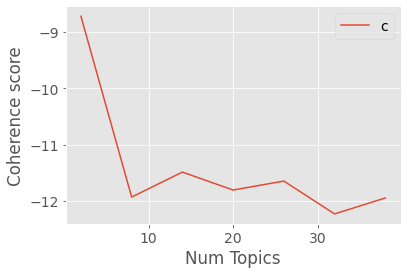

In [490]:
model_list, coherence_values = compute_coherence_values( model=lda_model, corpus=corpus, texts=corpus_token, start=2, limit=40, step=6)
# Show graph
import matplotlib.pyplot as plt
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

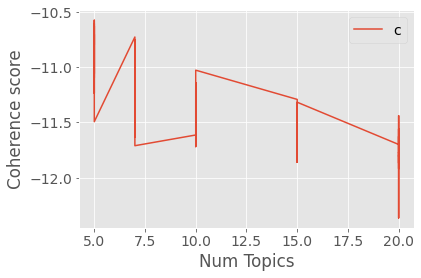

In [495]:
plt.plot(N, scores)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

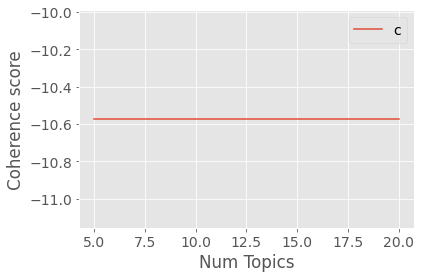

In [496]:
plt.plot(best_N, best_scores)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [40]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds="mmds", R=10)
vis

C:\Users\apoko\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.026480  0.029733       1        1  25.484380
5     -0.046076 -0.177979       2        1  19.340450
0     -0.161116 -0.080136       3        1  16.289348
6     -0.158854  0.148595       4        1  13.275357
4      0.106528 -0.139934       5        1  11.475977
3      0.210281  0.013597       6        1   7.788533
2      0.075717  0.206124       7        1   6.345954, topic_info=         Term        Freq       Total Category  logprob  loglift
158    supply  183.000000  183.000000  Default  10.0000  10.0000
16      chain  190.000000  190.000000  Default   9.0000   9.0000
431       say  195.000000  195.000000  Default   8.0000   8.0000
446  software  175.000000  175.000000  Default   7.0000   7.0000
567      cost   89.000000   89.000000  Default   6.0000   6.0000
..        ...         ...         ...      ...      ...      ...
26   continue    7.916424   18.886091   Topic7  -5.3510   1.8879
668       new    8.618700   29.527719   Topic7  -5.2660   1.5260
161      time   10.058063   71.645677   Topic7  -5.1116   0.7940
634  increase    8.655860   61.239723   Topic7  -5.2617   0.8008
433    secure    8.278754   48.850508   Topic7  -5.3063   0.9823

[185 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
3518      5  0.727720     absolute
877       1  0.169141  acquisition
877       2  0.042285  acquisition
877       4  0.718851  acquisition
877       6  0.042285  acquisition
...     ...       ...          ...
505       3  0.112556         year
505       4  0.084417         year
505       5  0.070347         year
505       6  0.154764         year
505       7  0.070347         year

[435 rows x 3 columns], R=10, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 6, 1, 7, 5, 4, 3])

# Classification with Word2Vec

In [39]:
import glob
import json
from gensim.models import Word2Vec
import gensim 
from gensim.utils import simple_preprocess



In [40]:
data = load_data("data/res.json")
data=data[0:92]
data[0]


"The world is a difficult place to be as a supply chain expert today and will only get more difficult in the future. We're living in a time of near unprecedented uncertainty in the modern era and the risk it brings to supply chain management is immense. To manage the potential chaos, you must be proactive and prepared to shift your strategies on a dime. From natural disasters and wars, to trade disputes and unreliable suppliers, you must be ready for everything.\n\nHow to create a strong risk management strategy.\n\nTrain your team in risk awareness and build organizational habits around it\n\nRisk management is built from the ground up. When you're trying to make plans around what could go wrong in your organization, you need to build a framework that allows individual employees to not only spot potential risks, but to report them with no fear or reprisal. Regular training programs on risks for your company and fast-response drills are integral to being ready when something goes wrong

In [70]:
final=[]
for file in data:
    #file=file.replace("\\","/")
    #with open (file,"r", encoding="utf-8") as f:
    text=file
    segments=text.split("\n\n")
    for segment in segments:
        segment=simple_preprocess(segment, deacc=True)
        if len(segment)>5:
            final.append(segment)

In [71]:
def load_data(file):
    with open (file, "r", encoding="utf-8") as f:
        data = json.load(f) 
    return (data)

def write_data(file, data):
    with open (file, "w", encoding="utf-8") as f:
        json.dump(data, f, indent=4)

In [72]:
write_data("demo_segments.json", final)

In [73]:
segments=load_data("demo_segments.json")

In [74]:
print(len(segments))

1675


In [75]:
final_t2v=[]
for file in data:
    #file=file.replace("\\","/")
    #with open (file,"r", encoding="utf-8") as f:
    text=file
    article_bits=text.split("\n\n")
    for segment in article_bits:
        if len(segment)>100:     # len() changed from 5 to 40 to see if longer phrases produce better results
            final_t2v.append(segment)

In [84]:
final_t2v

["The world is a difficult place to be as a supply chain expert today and will only get more difficult in the future. We're living in a time of near unprecedented uncertainty in the modern era and the risk it brings to supply chain management is immense. To manage the potential chaos, you must be proactive and prepared to shift your strategies on a dime. From natural disasters and wars, to trade disputes and unreliable suppliers, you must be ready for everything.",
 "Risk management is built from the ground up. When you're trying to make plans around what could go wrong in your organization, you need to build a framework that allows individual employees to not only spot potential risks, but to report them with no fear or reprisal. Regular training programs on risks for your company and fast-response drills are integral to being ready when something goes wrong. These processes should be well known at all levels of your organization and practiced regularly. Another important lesson to le

In [85]:
len(final_t2v)

1403

In [86]:
final_t2v[1]

"Risk management is built from the ground up. When you're trying to make plans around what could go wrong in your organization, you need to build a framework that allows individual employees to not only spot potential risks, but to report them with no fear or reprisal. Regular training programs on risks for your company and fast-response drills are integral to being ready when something goes wrong. These processes should be well known at all levels of your organization and practiced regularly. Another important lesson to learn, as underlined by McKinsey, is that employees should not worry about coming to their managers or executives with problems or mistakes they've made. A culture of blame, shooting the messenger and heavy punishment means that potential risks or mistakes in a company will remain hidden out of fear."

In [79]:
corpus=[]
for i in tqdm(range(len(final_t2v))):
    review = re.sub('[^a-zA-Z]', ' ', final_t2v[i])
    review = review.lower()
    review = review.split()
    review = [lemmatizer.lemmatize(word) for word in review if not word in set(stopwords.words('english'))]
    review = ' '.join(review)
    corpus.append(review)

100%|█████████████████████████████████████| 1403/1403 [00:13<00:00, 104.21it/s]


In [80]:
corpus

['world difficult place supply chain expert today get difficult future living time near unprecedented uncertainty modern era risk brings supply chain management immense manage potential chaos must proactive prepared shift strategy dime natural disaster war trade dispute unreliable supplier must ready everything',
 'risk management built ground trying make plan around could go wrong organization need build framework allows individual employee spot potential risk report fear reprisal regular training program risk company fast response drill integral ready something go wrong process well known level organization practiced regularly another important lesson learn underlined mckinsey employee worry coming manager executive problem mistake made culture blame shooting messenger heavy punishment mean potential risk mistake company remain hidden fear',
 'common acronym supply chain world always best keep prevention preparedness response recovery pprr front mind think developing risk management 

In [81]:
final_t2v[1]

"Risk management is built from the ground up. When you're trying to make plans around what could go wrong in your organization, you need to build a framework that allows individual employees to not only spot potential risks, but to report them with no fear or reprisal. Regular training programs on risks for your company and fast-response drills are integral to being ready when something goes wrong. These processes should be well known at all levels of your organization and practiced regularly. Another important lesson to learn, as underlined by McKinsey, is that employees should not worry about coming to their managers or executives with problems or mistakes they've made. A culture of blame, shooting the messenger and heavy punishment means that potential risks or mistakes in a company will remain hidden out of fear."

In [82]:
print(len(final_t2v))

1403


In [83]:
model = Word2Vec(segments, min_count=5)
model.save("demo.bin")

NameError: name 'Word2Vec' is not defined

In [ ]:
model=Word2Vec.load("demo.bin")

In [ ]:
# Training the Word2Vec model
model = Word2Vec(segments, min_count=10)


words = model.wv

# Finding Word Vectors
vector = model.wv.get_vector("risk")

# Most similar words
similar = model.wv.most_similar('risk')

In [ ]:
similar

In [ ]:
keyword="risk"

In [ ]:
res=model.wv.similar_by_word(keyword, topn=10)
for item in res:
    print(item)

In [87]:
from top2vec import Top2Vec

In [88]:
from gensim.models import KeyedVectors


In [89]:
model_T2V = Top2Vec(final_t2v, speed="deep-learn",ngram_vocab="True", workers=8,min_count=10)

2022-08-06 02:56:17,137 - top2vec - INFO - Pre-processing documents for training
2022-08-06 02:56:17,310 - top2vec - INFO - Creating joint document/word embedding
2022-08-06 02:57:03,371 - top2vec - INFO - Creating lower dimension embedding of documents
2022-08-06 02:57:10,699 - top2vec - INFO - Finding dense areas of documents
2022-08-06 02:57:10,742 - top2vec - INFO - Finding topics


In [90]:
len(model_T2V.vocab)

1459

In [225]:
topic_sizes, topic_nums = model_T2V.get_topic_sizes()
print(topic_sizes)

[201 162 155 105  94  85  83  70  67  66  64  56  56  55  44  40]


In [226]:
print(topic_nums)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]


In [227]:
topic_words, word_scores, topic_nums = model_T2V.get_topics()

In [228]:
for words, scores, num in zip(topic_words,word_scores,topic_nums):
    print(num)
    print(f"Words:{words}")

0
Words:['mediation' 'mediator' 'barbara' 'katherine' 'do so' 'you'
 'barbara reeves' 'know' 'go' 'you re' 'we' 've' 're' 'you can' 'want'
 'if you' 'want to' 'look' 'you need' 'so' 'little' 'going to' 'disputes'
 'we re' 'lot' 'can get' 'how do' 'going' 'something' 'we know' 'don know'
 'again' 'get' 'can' 'do' 'thing' 'think' 'can go' 'we ve' 'parties'
 'they re' 'if they' 'people' 'really' 'right' 'ahead' 'look at' 'left'
 'done' 'it']
1
Words:['predictive' 'platform' 'partssource' 'insights' 'blume' 'everstream'
 'infor' 'vamstar' 'visibility' 'data' 'analytics' 'resilinc'
 'intelligence' 'visibility into' 'sourcing' 'ai' 'network' 'enable'
 'technology' 'logistics' 'moody analytics' 'spend' 'resiliency'
 'everstream analytics' 'artificial' 'processes' 'clinical' 'value'
 'end visibility' 'moody' 'visit' 'blume global' 'provides'
 'artificial intelligence' 'deep' 'data driven' 'buyers' 'healthcare'
 'partssource pro' 'monitor' 'partnership' 'advanced analytics'
 'procurement' 'moni

In [236]:
documents, document_scores, document_ids = model_T2V.search_documents_by_topic(topic_num=7, num_docs=10)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 268, Score: 0.6232901215553284
-----------
The fallout from the Russia/Ukraine conflict and related sanctions cannot be understated. For more information concerning the impact of the conflict on the supply chain.
-----------

Document: 294, Score: 0.6203857660293579
-----------
18 What’s Next for Oil And Gas Prices As Sanctions on Russia Intensity, J.P .Morgan (March 10, 2022).
-----------

Document: 264, Score: 0.5877672433853149
-----------
There are three major issues affecting the state of transportation and related freight cost: the COVID-19 pandemic, the 2022 Russian invasion of Ukraine, and shipping issues in the supply chain.
-----------

Document: 1330, Score: 0.5785390138626099
-----------
“Russia and Ukraine are both key suppliers of grain, so there are a lot of grain exports coming from these countries that are now disrupted,” Mr. Khanna said. Vessels operating in the Black Sea, a major trading region, have been severely disrupted, he said.
-----------

Document: 

In [96]:
topic_words, word_scores, topic_scores, topic_nums = model_T2V.search_topics(keywords=["supply", "chain", "risk"], num_topics=10)


In [238]:
topic_nums

array([ 1,  2,  4,  5,  8,  7,  6, 12, 15,  9], dtype=int64)

In [239]:
topic_scores

array([0.2808602 , 0.26566736, 0.17644288, 0.17040842, 0.1435175 ,
       0.12046092, 0.09133282, 0.07569887, 0.0734317 , 0.06441533])

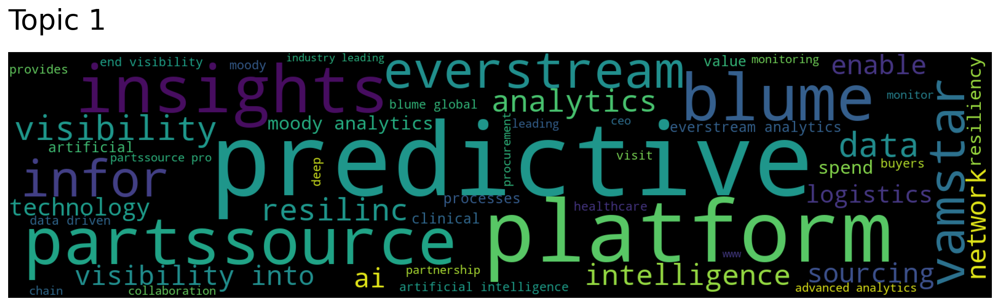

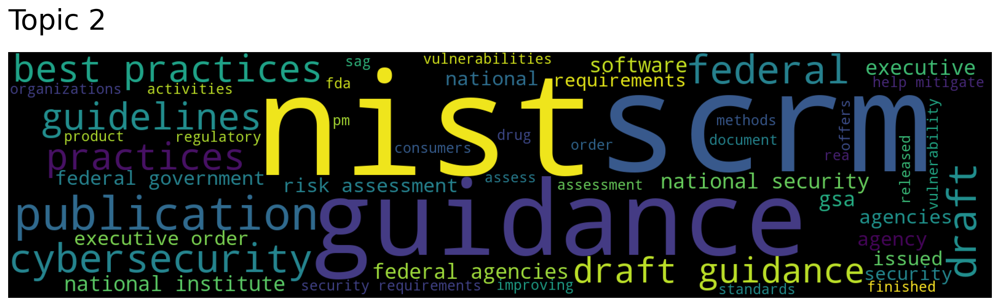

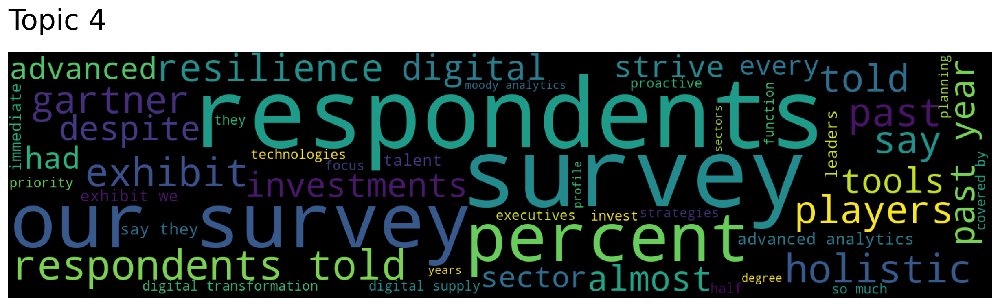

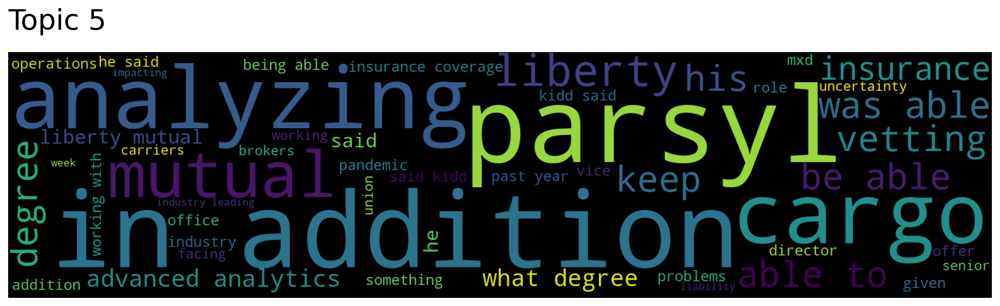

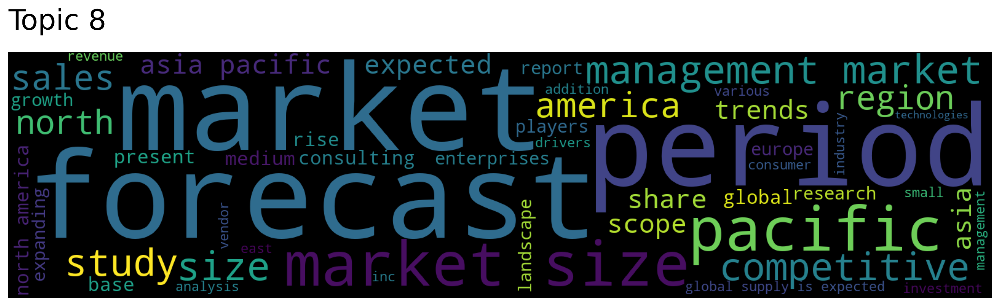

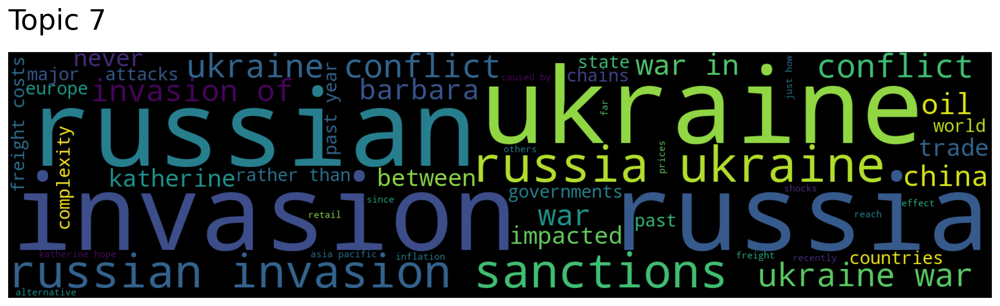

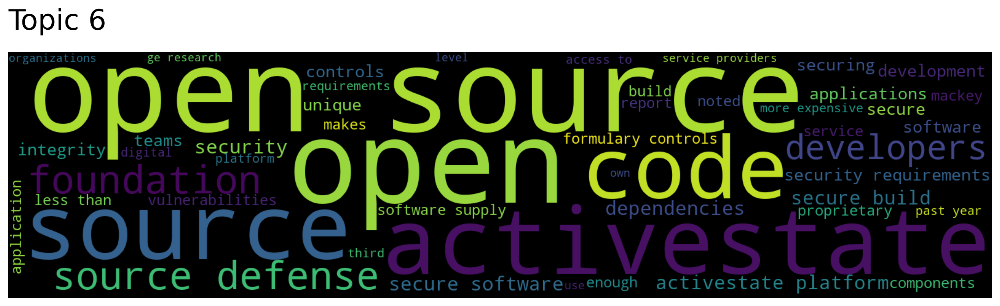

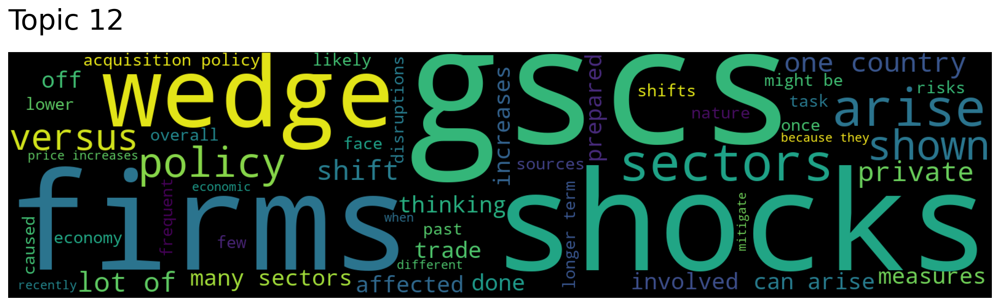

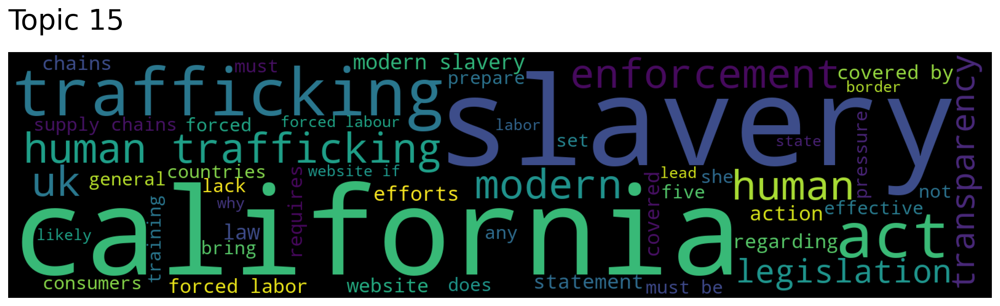

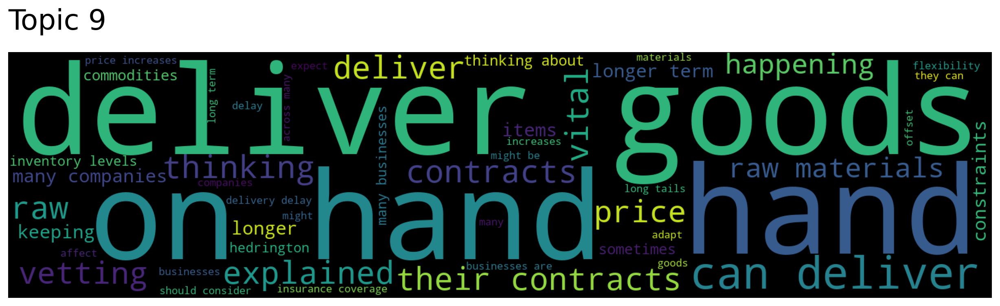

In [242]:
topic_words, word_scores, topic_scores, topic_nums = model_T2V.search_topics(keywords=["supply", "chain", "risk"], num_topics=10)
for topic in topic_nums:
    model_T2V.generate_topic_wordcloud(topic)

NameError: name 'topic_nums' is not defined

In [243]:
words, word_scores = model_T2V.similar_words(keywords=["supply", "chain", "risk"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

management 0.543874053795529
and 0.5343751208534648
the 0.48903868029247777
of 0.47665336086643634
that 0.46430309514102097
for 0.4560578294366109
in 0.4331586281803622
chains 0.4299750691341083
have 0.41937566532018866
risks 0.4086356651104202
to 0.4056082807241401
are 0.40546992601643006
organizations 0.4014693132410101
as 0.38122290432734496
help 0.3796660134022593
can 0.37832304197855293
has 0.3753889286852715
how 0.37395590271608714
their 0.3734486740146221
on 0.372953816217838


In [69]:
#pip install top2vec[sentence_encoders]

In [91]:
#Alternative model parameters
model = Top2Vec(corpus, speed="deep-learn", ngram_vocab="True", min_count=10 ,workers=8)


2022-08-06 02:57:10,792 - top2vec - INFO - Pre-processing documents for training
2022-08-06 02:57:10,912 - top2vec - INFO - Creating joint document/word embedding
2022-08-06 02:57:44,517 - top2vec - INFO - Creating lower dimension embedding of documents
2022-08-06 02:57:48,176 - top2vec - INFO - Finding dense areas of documents
2022-08-06 02:57:48,217 - top2vec - INFO - Finding topics


In [92]:
len(model.vocab)

1190

In [93]:
topic_sizes, topic_nums = model.get_topic_sizes()
print(topic_sizes)

[182 164 142 137 132 128 125 119  86  73  63  52]


In [94]:
print(topic_nums)

[ 0  1  2  3  4  5  6  7  8  9 10 11]


In [97]:
for words, scores, num in zip(topic_words,word_scores,topic_nums):
    print(num)
    print(f"Words:{words}")

1
Words:['predictive' 'platform' 'partssource' 'insights' 'visibility'
 'everstream' 'infor' 'analytics' 'intelligence' 'blume' 'vamstar'
 'resilinc' 'visibility into' 'everstream analytics' 'data' 'ai'
 'sourcing' 'logistics' 'enable' 'clinical' 'artificial intelligence'
 'moody analytics' 'end visibility' 'artificial' 'blume global'
 'processes' 'spend' 'partnership' 'resiliency' 'technology' 'buyers'
 'network' 'healthcare' 'partssource pro' 'value' 'moody' 'visit'
 'leading' 'provides' 'procurement' 'solutions' 'activestate platform'
 'monitoring' 'data driven' 'deep' 'capabilities' 'chain' 'customer'
 'industry leading' 'ceo']
2
Words:['fda' 'respondents' 'drug' 'shocks' 'drugs' 'gscs' 'draft' 'past'
 'survey' 'almost' 'our survey' 'sectors' 'wedge' 'plans' 'covered by'
 'can arise' 'firms' 'task' 'draft guidance' 'manufacturers'
 'manufacturing' 'investments' 'political' 'production' 'percent' 'public'
 'redundancy' 'regulatory' 'strategies' 'holistic' 'agency' 'mitigate'
 'examp

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["supply", "chain", "risk"], num_topics=14)
for topic in topic_nums:
    model_T2V.generate_topic_wordcloud(topic)

In [ ]:
words, word_scores = model.similar_words(keywords=["supply", "chain", "risk"], keywords_neg=[], num_words=30)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

# Sentiment Analysis on the selected articles

Positive Sentiment: 64.00
Neutral Sentiment: 1.00
Negative Sentiment: 30.00


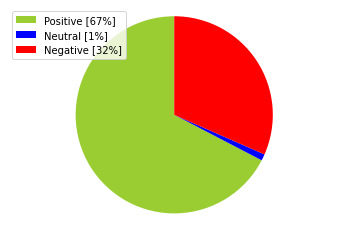

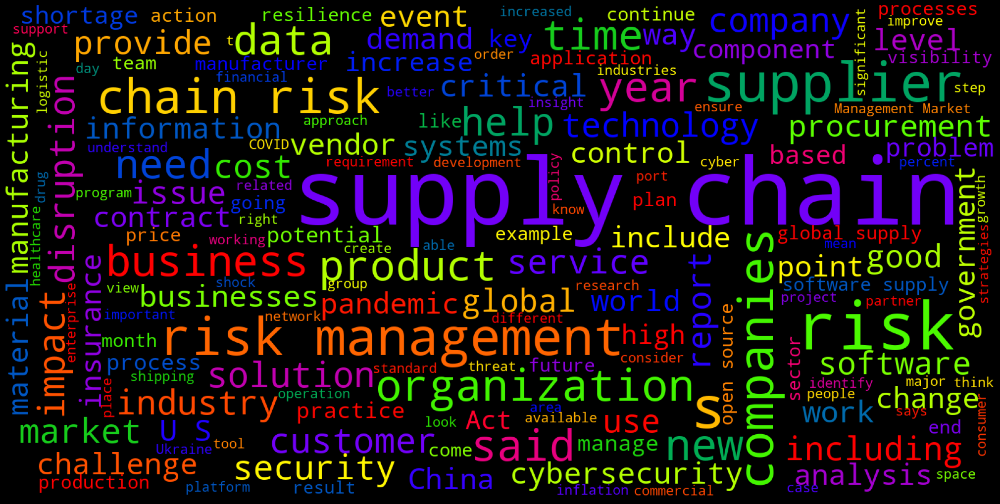

In [254]:
def percentage(part,whole):
    return 100 * float(part)/float(whole)

#Assigning Initial Values
positive = 0
negative = 0
neutral = 0
#Creating empty lists
news_list = []
neutral_list = []
negative_list = []
positive_list = []

#Iterating over the tweets in the dataframe
for news in news_df['Article']:
    news_list.append(news)
    analyzer = SentimentIntensityAnalyzer().polarity_scores(news)
    neg = analyzer['neg']
    neu = analyzer['neu']
    pos = analyzer['pos']
    comp = analyzer['compound']

    if neg > pos:
        negative_list.append(news) #appending the news that satisfies this condition
        negative += 1 #increasing the count by 1
    elif pos > neg:
        positive_list.append(news) #appending the news that satisfies this condition
        positive += 1 #increasing the count by 1
    elif pos == neg:
        neutral_list.append(news) #appending the news that satisfies this condition
        neutral += 1 #increasing the count by 1 

positive = percentage(positive, len(news_df)) #percentage is the function defined above
negative = percentage(negative, len(news_df))
neutral = percentage(neutral, len(news_df))

#Converting lists to pandas dataframe
news_list = pd.DataFrame(news_list)
neutral_list = pd.DataFrame(neutral_list)
negative_list = pd.DataFrame(negative_list)
positive_list = pd.DataFrame(positive_list)
#using len(length) function for counting
print("Positive Sentiment:", '%.2f' % len(positive_list), end='\n')
print("Neutral Sentiment:", '%.2f' % len(neutral_list), end='\n')
print("Negative Sentiment:", '%.2f' % len(negative_list), end='\n')

#Creating PieCart
labels = ['Positive ['+str(round(positive))+'%]' , 'Neutral ['+str(round(neutral))+'%]','Negative ['+str(round(negative))+'%]']
sizes = [positive, neutral, negative]
colors = ['yellowgreen', 'blue','red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
#plt.title("Sentiment Analysis Result for stock= "+Article+"" )
plt.axis('equal')
plt.show()

# Word cloud visualization
def word_cloud(text):
    stopwords = set(STOPWORDS)
    allWords = ' '.join([nws for nws in text])
    wordCloud = WordCloud(background_color='black',width = 1600, height = 800,stopwords = stopwords,min_font_size = 20,max_font_size=150,colormap='prism').generate(allWords)
    fig, ax = plt.subplots(figsize=(20,10), facecolor='k')
    plt.imshow(wordCloud)
    ax.axis("off")
    fig.tight_layout(pad=0)
    plt.show()

#print('Wordcloud for ' + Article.values)
word_cloud(news_df['Article'].values)

In [255]:
import pandas as pd
from nltk.corpus import stopwords
import re
import nltk
nltk.download('stopwords')
stop = set(stopwords.words("english"))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\apoko\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


In [256]:
def preprocess(text):
    text_input = re.sub('[^a-zA-Z1-9]+', ' ', str(text))
    output = re.sub(r'\d+', '',text_input)
    return output.lower().strip()

def remove_stopwords(text):
    filtered_words = [word.lower() for word in text.split() if word.lower() not in stop]
    return " ".join(filtered_words)

In [257]:
news_df['Article'] = news_df.Article.map(preprocess)
news_df['Article'] = news_df.Article.map(remove_stopwords)

In [258]:
news_df

,Unnamed: 0,Date,Title,Article,date
0,90,01 Nov 2021,Supply chain risk management is now a GovCon n...,backdrop highly publicized cyber hacks ransomw...,2021-11-01
1,66,04 Nov 2021,Managing supply chain risk requires new priori...,words like supply chain logistics first became...,2021-11-04
2,86,16 Nov 2021,Supply Chain & Procurement Live: Risk and resi...,supply chain live session three supply procure...,2021-11-16
3,72,23 Nov 2021,How COVID-19 is reshaping supply chains,may much world still grip first wave covid pan...,2021-11-23
4,77,06 Dec 2021,Supply Chain Risk Isn’t Going Away Anytime Soon,holidays approached supply chains remain strai...,2021-12-06
...,...,...,...,...,...
90,70,23 Jun 2022,Increase in leptin levels in preeclampsia prom...,baby ever born critical supply chain problems ...,2022-06-23
91,76,23 Jun 2022,Military rad-hard design activity robust despi...,military rad hard design activity robust despi...,2022-06-23
92,43,23 Jun 2022,"Rising at CAGR of 14.5% from 2022 to 2030, Ven...",acumen research consulting acumen research con...,2022-06-23
93,57,23 Jun 2022,IonQ and GE Research Demonstrate High Potentia...,college park md business wire ionq nyse ionq i...,2022-06-23


In [21]:
def build_corpus(news_df):
    corpus = []
    for sentence in news_df.iteritems():
        word_list = sentence[1].split(" ")
        corpus.append(word_list)
    return corpus

corpus = build_corpus(news_df['Article'])

In [22]:
corpus

[['significant',
  'volatility',
  'continues',
  'disrupt',
  'equity',
  'markets',
  'major',
  'stock',
  'indexes',
  'swinging',
  'multiple',
  'percentage',
  'points',
  'often',
  'daily',
  'basis',
  'inflation',
  'rising',
  'interest',
  'rates',
  'ukraine',
  'crisis',
  'continuing',
  'effects',
  'covid',
  'lasting',
  'supply',
  'chain',
  'issues',
  'difficult',
  'regulatory',
  'environment',
  'uncertainty',
  'regarding',
  'global',
  'u',
  'economies',
  'undeniable',
  'impact',
  'pace',
  'activity',
  'far',
  'opening',
  'months',
  'witnessed',
  'number',
  'significant',
  'transactions',
  'despite',
  'headwinds',
  'cash',
  'deals',
  'handful',
  'large',
  'stock',
  'cash',
  'stock',
  'mergers',
  'announced',
  'date',
  'among',
  'take',
  'two',
  'zynga',
  'cash',
  'stock',
  'transaction',
  'recently',
  'intercontinental',
  'exchange',
  'billion',
  'acquisition',
  'black',
  'knight',
  'announced',
  'last',
  'week',
  '

In [23]:
from gensim.models import Word2Vec
model = Word2Vec(corpus, vector_size=100, min_count=1)

In [24]:
model

In [39]:
from sklearn.decomposition import PCA

# fit a 2d PCA model to the vectors
vectors =model[model.wv.key_to_index]
words = list(model.wv.key_to_index)
pca = PCA(n_components=2)
PCA_result = pca.fit_transform(vectors)

# prepare a dataframe
words = pd.DataFrame(words)
PCA_result = pd.DataFrame(PCA_result)
PCA_result['x_values'] =PCA_result.iloc[0:, 0]
PCA_result['y_values'] =PCA_result.iloc[0:, 1]
PCA_final = pd.merge(words, PCA_result, left_index=True, right_index=True)
PCA_final['word'] =PCA_final.iloc[0:, 0]
PCA_data_complet =PCA_final[['word','x_values','y_values']]

AttributeError: 'KeyedVectors' object has no attribute 'get_item'